 # AUTOMATIC CHORD-SCALE DETECTION & STUDENT PERFORMANCE ASSESMENT FOR JAZZ IMPROVISATION 
 
 ## PART 3 : ANALYSIS ON MUSICCRITIC: SCALE EXERCISE 

In [5]:
import sys,os
sys.path.append(os.path.join(os.path.dirname('__file__'), 'freesound-python/'))

from IPython.display import Audio
from IPython.core.display import display, HTML, Image

from utilities import *

#Directory for audio files
audioDir = 'audio/'
#Directory for audio segment annotations
annotationsDir = 'scale_annotations/'
#Directory for Feature Data (.csv and pickle files)
dataDir = 'data/'

#ANALYSIS PARAMETERS FOR FEATURE EXTRACTION

params=AnalysisParams(200,100,'hann',2048,44100,12)

#MUSICCRITIC ANALYSIS PARAMETERS

AUDIODIR = 'ScaleExercise_audio/'
if os.path.exists(AUDIODIR) != 1:
    os.mkdir(AUDIODIR)
FILEDIR = 'chord-scale_exercise/'

EXERCISEFILE = 'exercise.json'
IMAGEPATH = 'img/'
if os.path.exists(IMAGEPATH) != 1:
    os.mkdir(IMAGEPATH)

studentPerformances = []
for file in os.listdir(AUDIODIR):
    if not file.endswith('mix.mp3') :
        studentPerformances.append(file)
print(studentPerformances)        

['868.wav', '861.wav', 'CSVfilefor_12bins.csv', '865.wav', '857.wav', '863.wav', '860.wav', '869.wav', '570.mp3', '858.wav', '859.wav', '862.wav', '866.wav', '571.mp3', '870.wav', '864.wav', '867.wav']


In [2]:
### FIRST, LET'S DEFINE A DICTIONARY THAT CONTAINS ALL THE PREDEFINED SCALE TEMPLATES

ScaleTemplates = dict()
    
ScaleTemplates['major'] = {'scaleArray':[1,0,1,0,1,1,0,1,0,1,0,1]}
ScaleTemplates['dorian'] = {'scaleArray':[1,0,1,1,0,1,0,1,0,1,1,0]}
ScaleTemplates['phrygian'] = {'scaleArray':[1,1,0,1,0,1,0,1,1,0,1,0]}
ScaleTemplates['lydian'] = {'scaleArray':[1,0,1,0,1,0,1,1,0,1,0,1]}
ScaleTemplates['mixolydian'] = {'scaleArray':[1,0,1,0,1,1,0,1,0,1,1,0]}
ScaleTemplates['minor'] = {'scaleArray':[1,0,1,1,0,1,0,1,1,0,1,0]}
ScaleTemplates['locrian'] = {'scaleArray':[1,1,0,1,0,1,1,0,1,0,1,0]}
ScaleTemplates['lydianb7'] = {'scaleArray':[1,0,1,0,1,0,1,1,0,1,1,0]}
ScaleTemplates['altered'] = {'scaleArray':[1,1,0,1,1,0,1,0,1,0,1,0]}
ScaleTemplates['mminor'] = {'scaleArray':[1,0,1,1,0,1,0,1,0,1,0,1]}
ScaleTemplates['hminor'] = {'scaleArray':[1,0,1,1,0,1,0,1,1,0,0,1]}
ScaleTemplates['hwdiminished'] = {'scaleArray':[1,1,0,1,1,0,1,1,0,1,1,0]}
ScaleTemplates['wholetone'] = {'scaleArray':[1,0,1,0,1,0,1,0,1,0,1,0]}
ScaleTemplates['chromatic'] = {'scaleArray':[1,1,1,1,1,1,1,1,1,1,1,1]}

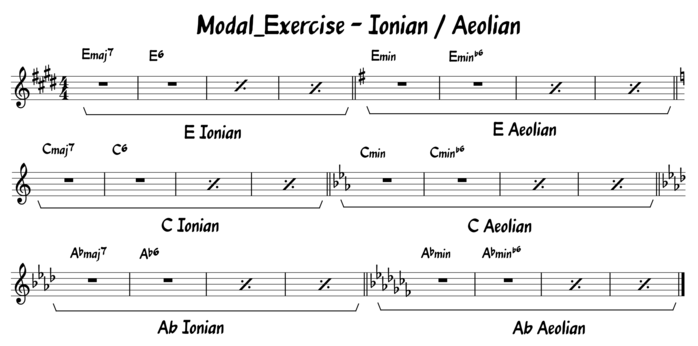

In [3]:
Image(filename = IMAGEPATH + "scalesexercise.png", width=700, height=700)

In [7]:
FILENAME = '869.wav'
Audio(os.path.join(AUDIODIR, FILENAME), rate = params.fs)

#### FEATURE EXTRACTION 

In [8]:
FEATURES_Student = FeatureExtraction_single(FILENAME,AUDIODIR,params,EXERCISEFILE,FILEDIR)

#### ANALYSIS ON SEPERATED REGIONS OF THE EXERCISE

The most likelihood scale of the student performance in Part3 is : 

wholetone 



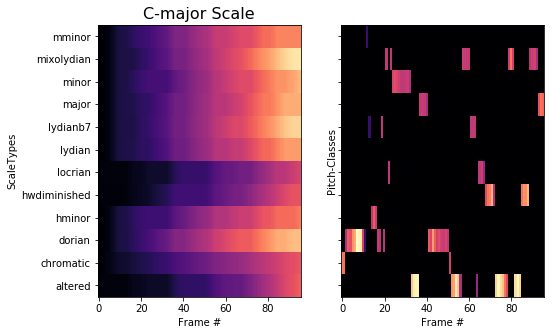

PERFORMANCE ASSESSMENT : 

In-Scale Rate : 75.7860022366 % 

In-Scale Completeness : 100.0 % 

In-Scale Choice Correctness : 46.29100498862757 % 



In [12]:
PART = '3'   ###Select Part for analysis

PartData = FEATURES_Student['Part'+str(PART)]


LikeliestScale = SegmentAnalysis(PartData,ScaleTemplates)



InScaleRate, ScaleChoiceCorrectness, ScaleCompleteness = PerformanceAssessment(PartData,LikeliestScale,ScaleTemplates)

print('PERFORMANCE ASSESSMENT : \n' )

print('In-Scale Rate : ' + str(InScaleRate*100) + ' % \n')
'''
Inscale Rate = sum(InscaleBins.mean)/sum(allBins.mean)
'''
print('In-Scale Completeness : ' + str(ScaleCompleteness*100) + ' % \n')
'''
Completeness = sum(StudentInscaleBins/sum(AllInscaleBins)
'''

print('In-Scale Choice Correctness : ' + str(ScaleChoiceCorrectness*100) + ' % \n')
'''
Cosine Similarity between the binary templates of likeliest scale & Expected Scale
'''

audioSegment = SegmentExerciseAudio(os.path.join(AUDIODIR, FILENAME),PartData,params)
Audio(audioSegment, rate = params.fs)